In [4]:
# Import all necessary packages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image
import urllib.request
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from typing import List

In [ ]:
!pip install requests
!pip install pillow

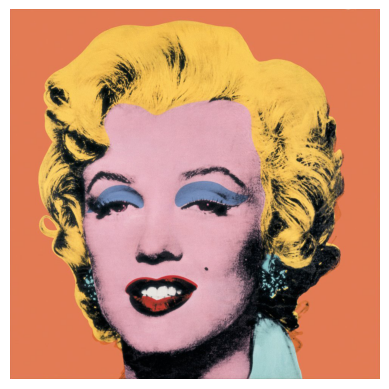

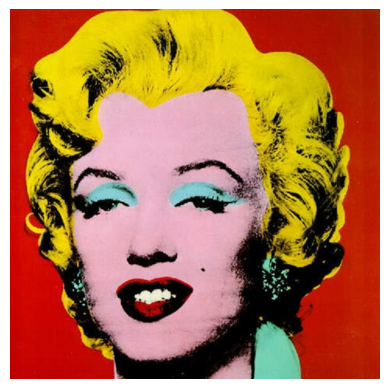

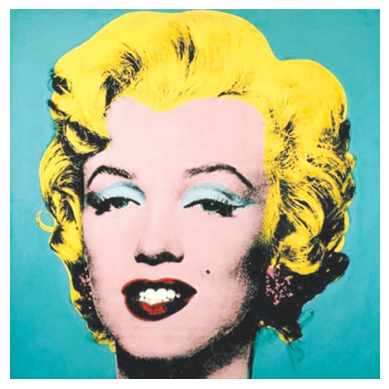

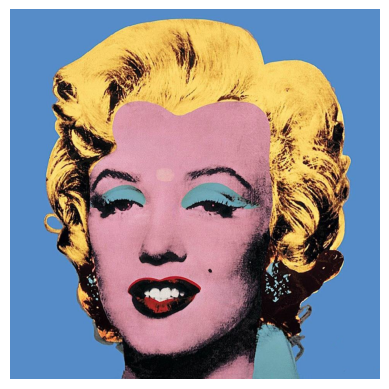

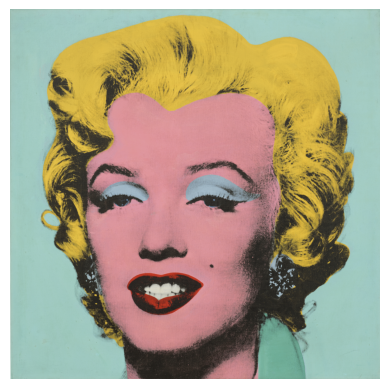

In [5]:
# Import in and load images
import requests
pic1 = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203191222-16N8MP7K7EACDQ1EVJ7E/shot_orange_marilyn_1964-19604.png?format=2000w'
pic2 = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203192094-MIQYNYEIJYJBY957F7T7/shot_red_marilyn_1964-19604.png?format=2000w'
pic3 = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652213792503-2Q9A294S9UOFEBQZQQNP/shot_turq_marilyn_1964-19604.png?format=2000w'
pic4 = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203207667-AHQD95AZ4Z1MCZ5B4C0N/shot_blue_marilyn_1964-19604.png?format=2000w'
pic5 = 'https://images.squarespace-cdn.com/content/v1/5a98653d96e76f7f7dc569c7/1652203189304-UFR2YYN9605G0IW13YHJ/shot_eggblue_marilyn_1964-19604.png?format=2000w'


# Image Dictionary
image_list = [pic1, pic2, pic3, pic4, pic5]
images = []

# Loop to show images
for i in range(len(image_list)):
  im = Image.open(requests.get(image_list[i], stream=True).raw)
  images.append(np.array(im))
  plt.imshow(images[i])
  plt.axis('off')
  plt.show()

COLOR DISTRIBUTIONS

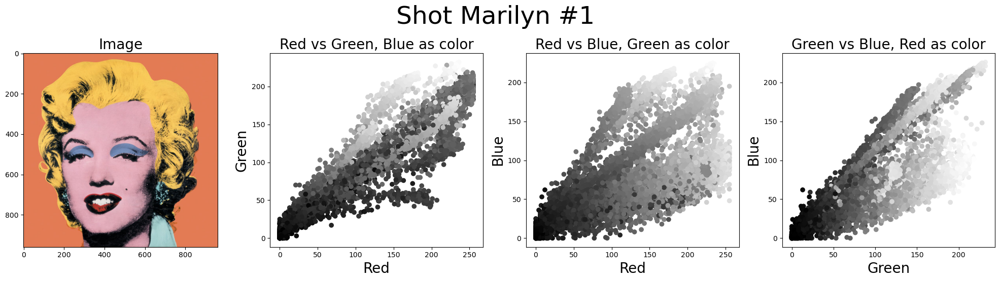

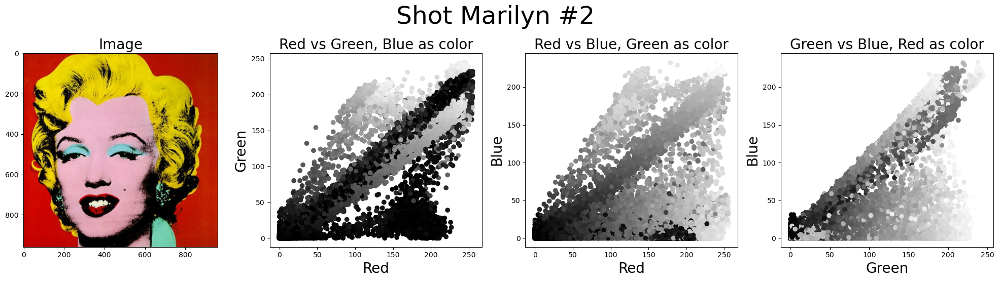

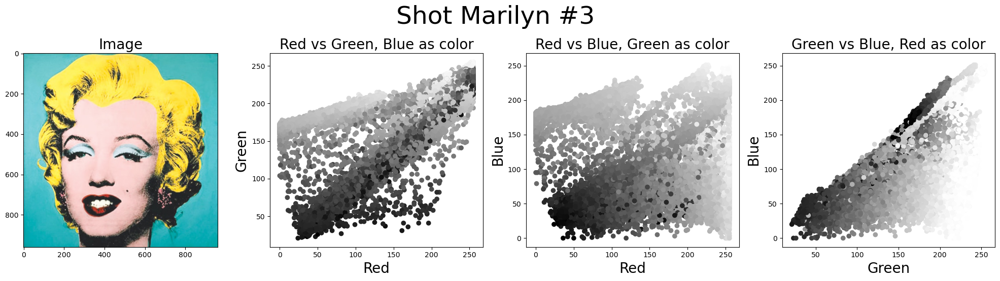

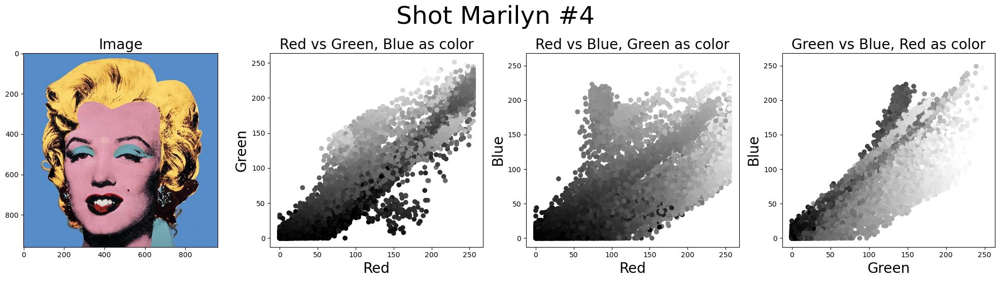

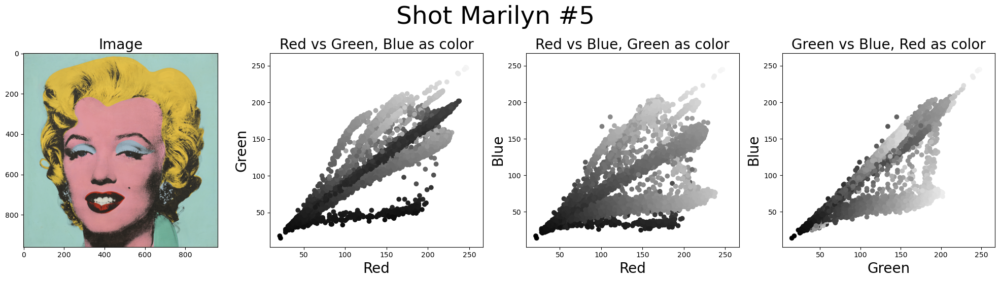

In [7]:
# SCATTER PLOTS

for i in range(len(images)):
    pixels = images[i].reshape(-1, images[i].shape[-1])
    
    # random sampling of pixels
    indices = np.random.choice(pixels.shape[0], size=40000, replace=False)
    pixels = pixels[indices]

    # Separate the color channels
    r, g, b = pixels[:, 0], pixels[:, 1], pixels[:, 2]

    # Create a figure
    plt.figure(figsize=(20, 5))

    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)

    # Image
    plt.subplot(1, 4, 1)
    plt.imshow(images[i])
    plt.title('Image', fontsize=20)

    # Plot: Red vs Green, Blue as color
    plt.subplot(1, 4, 2)
    plt.scatter(r, g, c=b, cmap='gray')
    plt.title('Red vs Green, Blue as color', fontsize=20)
    plt.xlabel('Red', fontsize=20)
    plt.ylabel('Green', fontsize=20)

    # Plot: Red vs Blue, Green as color
    plt.subplot(1, 4, 3)
    plt.scatter(r, b, c=g, cmap='gray')
    plt.title('Red vs Blue, Green as color', fontsize=20)
    plt.xlabel('Red', fontsize=20)
    plt.ylabel('Blue', fontsize=20)

    # Plot: Green vs Blue, Red as color
    plt.subplot(1, 4, 4)
    plt.scatter(g, b, c=r, cmap='gray')
    plt.title('Green vs Blue, Red as color', fontsize=20)
    plt.xlabel('Green', fontsize=20)
    plt.ylabel('Blue', fontsize=20)

    plt.tight_layout()
    plt.suptitle('Shot Marilyn #' + str(i+1), y=1.1, fontsize=35)
    plt.show()

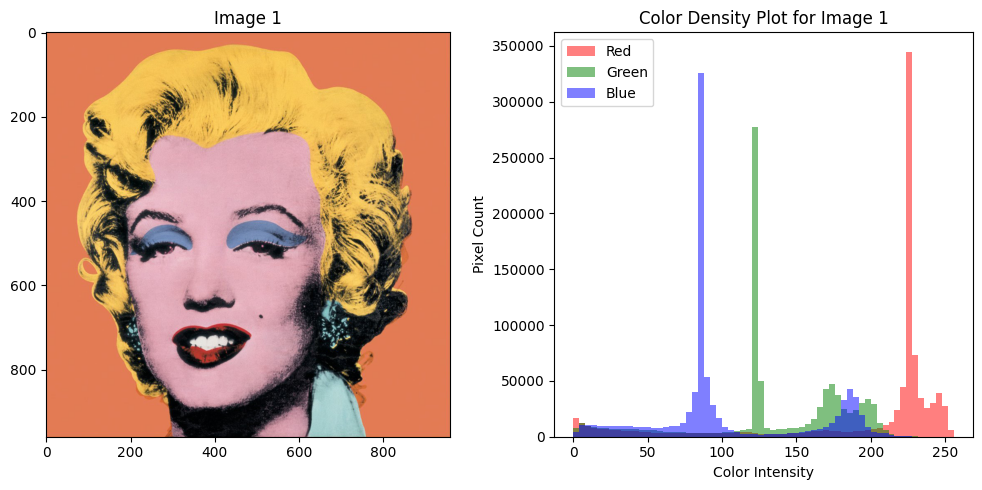

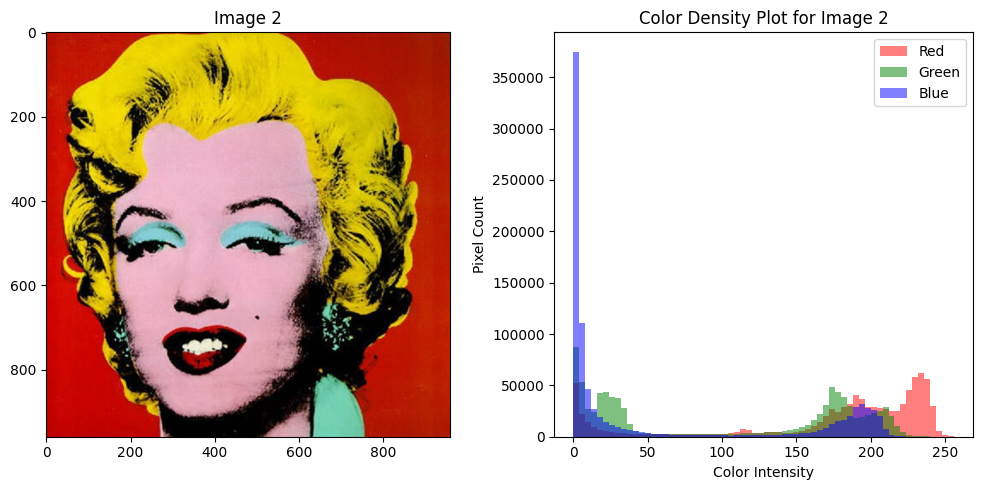

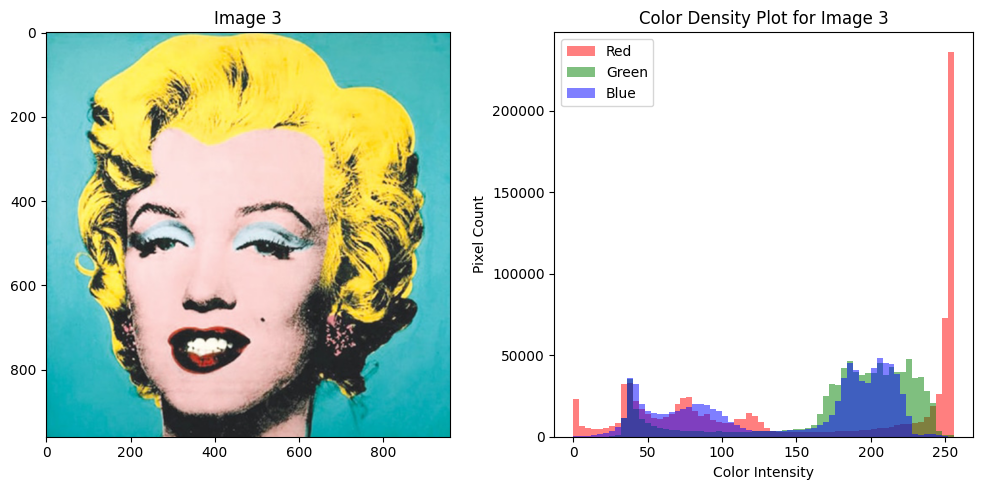

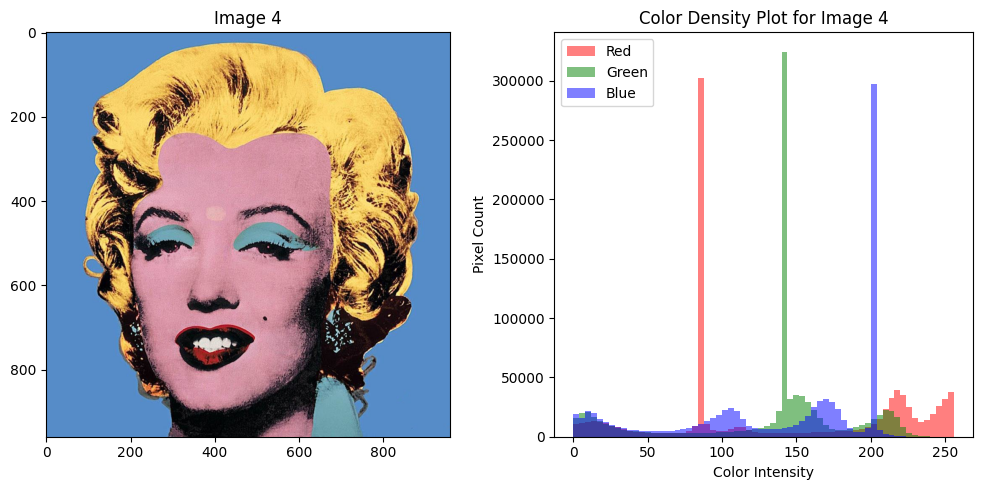

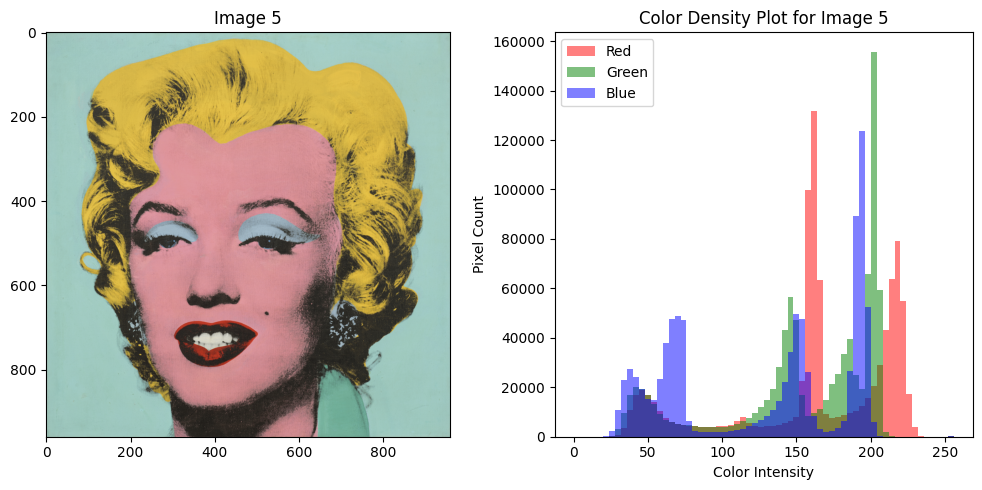

In [ ]:
# COLOR DENSITY PLOTS
for i in range(len(images)):
  flattened_image = images[i].reshape(-1, images[i].shape[-1])
  red_channel = flattened_image[:, 0]
  green_channel = flattened_image[:, 1]
  blue_channel = flattened_image[:, 2]

  plt.figure(figsize=(10, 5))  # Create a new figure (optional: specify size)

  # Plot the image
  plt.subplot(1, 2, 1)  # Select the first subplot in a 1x2 grid
  plt.imshow(images[i])
  plt.title('Image ' + str(i+1))

  # Plot the color histograms
  plt.subplot(1, 2, 2)  # Select the second subplot in a 1x2 grid
  plt.hist(red_channel, bins=64, range=[0, 256], color='red', alpha=0.5, label='Red')
  plt.hist(green_channel, bins=64, range=[0, 256], color='green', alpha=0.5, label='Green')
  plt.hist(blue_channel, bins=64, range=[0, 256], color='blue', alpha=0.5, label='Blue')

  plt.xlabel('Color Intensity')
  plt.ylabel('Pixel Count')
  plt.title('Color Density Plot for Image ' + str(i+1))
  plt.legend()

  plt.tight_layout()  # Adjust subplot parameters to give specified padding
  plt.show()

In [ ]:
# Image Manipulation for Exploratory Data Analysis

In [ ]:
# Test dimension manipulation with the 1st photo as a test variable
for i in range(len(images)):
  test = images[i]
  print("Image ", i, " shape: ", test.shape)


Image  0  shape:  (960, 960, 4)
Image  1  shape:  (960, 960, 4)
Image  2  shape:  (960, 960, 4)
Image  3  shape:  (960, 960, 3)
Image  4  shape:  (960, 960, 4)


Dimension of Image:  (960, 960) 



(-0.5, 959.5, 959.5, -0.5)

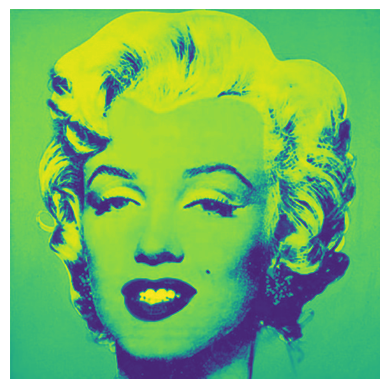

In [ ]:
# Splice image 1 into 2-Dimensional matricies based data in 3rd Dimension

test1 = images[2]
test1.shape

a = test1[:,:,0]
b = test1[:,:,1]
c = test1[:,:,2]
d = test1[:,:,3]

print("Dimension of Image: ", c.shape, "\n")

# Plot spliced image
plt.imshow(b)
plt.axis('off')

In [ ]:
# Image compression using SVD for exploratory data analysis

# Manipulate k-singular value to obtain various reconstruction of images, and see 
# how images are reconstructed and their errors

def compress_svd(matrix:List[List[int]], k:int)->List[List[int]]:
    """
    use svd to perform matrix compression
    use the svd function from numpy.linalg to perfrom the svd decomposition
    use the first k singular values to reconstruct the compressed matrix
    """
    
    u, s, v = np.linalg.svd(matrix, full_matrices=False)
    compressed_matrix = u[:,:k] @ np.diag(s[:k]) @ v[:k,:]
    
    return compressed_matrix

def compress_show_images_reshape(matrix:List[List[int]], k:int, show_image=True):
    """
    k (int): number of singular values used for image compression;
    show_image (boolean): whether to plot the compressed images or not;
    
    Concatenate the first three layers of the image tensor into one wide 
    matrix;
    
    Use compress_svd function to perform svd compression;
    
    Reshape the wide compressed matrix into an image tensor of three 
    layers;
    
    Put the number of singular values and reconstruction error in the 
    title;
    
    return reconst_error (float), which is the mean squared error 
    of the compressed image
    """
    
    original_shape = matrix.shape
    m = original_shape[0]
    n = original_shape[1]
    r = matrix[:,:,0]
    g = matrix[:,:,1]
    b = matrix[:,:,2]
    l = matrix[:,:,3]
    concat_mat = np.concatenate((r, g, b, l), axis=1)
    mat_reconst = compress_svd(concat_mat, k)
    reconst_mat = np.zeros_like(matrix)
    reconst_mat[:,:,0] = mat_reconst[:,:(n)]
    reconst_mat[:,:,1] = mat_reconst[:,(n):(2*n)]
    reconst_mat[:,:,2] = mat_reconst[:,(2*n):(3*n)]
    reconst_mat[:,:,3] = mat_reconst[:,(3*n):(4*n)]
    
    reconst_error = np.mean((matrix - reconst_mat) ** 2)
    
    if show_image==True:
        plt.title("Singular values={:.2f}, Reconstruction error={:.2f}".format(k, reconst_error))
        plt.imshow(reconst_mat)
        plt.axis('off')
        plt.show
    
    return reconst_error

22.685507269965278

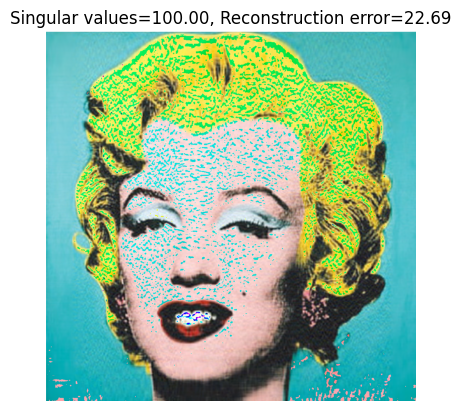

In [ ]:
compress_show_images_reshape(images[2], 100)

HRC

In [ ]:
#%% HRC PROCESSING FUNCTION
def HRCprocessing(image, num_k_clust, hrc_dist):

    from sklearn.cluster import MiniBatchKMeans
    from matplotlib import pyplot as plt
    import numpy as np
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D
    from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
    from sklearn.datasets import make_blobs
    
    # Load image and flatten for use in k-means
    image_processing = image.reshape(-1, image.shape[-1])
    image_processing = image_processing[:,:3]
        
    # Normalize pixel values to 0-1
    image_processing = image_processing / 255
        
    # Perform k-means clustering
    kmeans = MiniBatchKMeans(n_clusters=num_k_clust)
    kmeans.fit(image_processing)
        
    # Replace each pixel value with its corresponding cluster center
    clustered_pixels = kmeans.cluster_centers_[kmeans.predict(image_processing)]
    clustered_image = clustered_pixels.reshape((960,960,3))
        
    # Plot original and clustered image
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[1].imshow(clustered_image)
    ax[1].set_title('Clustered Image')
    plt.show()
        
    ## HRC
    unique_colors = np.unique(clustered_pixels, axis=0)
    
    # Perform hierarchical clustering
    Z = linkage(unique_colors, 'ward')
    
    # Plot the dendrogram
    plt.figure(figsize=(15, 5))
    plt.title('Hierarchical Clustering Dendrogram')
    dendrogram(Z)
    plt.show()
    
    # adjust hrc_dist for HRC cluster cut-offs
    clusters = fcluster(Z, hrc_dist, criterion='distance')
    
    # Print cluster labels
    print("Cluster labels:", clusters)
    
    # assign clustered pixels from the k-means clustering to the groups from the HC clustering
    
    color_key = np.hstack((unique_colors, clusters.reshape(-1,1)))
    pixels_clusters = []
    
    for i in range(clustered_pixels.shape[0]):
        for j in range(color_key.shape[0]):
            if all(clustered_pixels[i,:] == color_key[j,:3]):
                pixels_clusters.append(int(color_key[j,3]))
    
    # add new cluster labels to the pixel array
    
    doubleclustered_pixels = np.hstack((clustered_pixels, np.array(pixels_clusters).reshape((-1,1))))
    
    # modify clustered pixels
    
    for j in np.unique(clusters):
        modified_pixels = np.zeros((clustered_pixels.shape))
            
        for x in range(doubleclustered_pixels.shape[0]):
            if doubleclustered_pixels[x,3] == j:
                modified_pixels[x,:3] = [0,1,0]
            else:
                modified_pixels[x,:3] = doubleclustered_pixels[x,:3]
            
        # display modified image
        modified_image = modified_pixels.reshape((960,960,3)).astype('float')
        plt.imshow(modified_image)
        plt.show()
    
    ## OUTPUTTING CLUSTER COLORS

    # sorting the colors by cluster
    sorted_indices = np.argsort(color_key[:, 3])
    color_key = color_key[sorted_indices]

    # Create an image where each row is a color from color_key[:,:3]
    image = np.repeat(color_key[np.newaxis, :, :3], repeats=100, axis=0)

    plt.figure(figsize=(20,10))  # Adjust as needed
    plt.imshow(image)

    plt.axis('off')  # Hide axes
    plt.show()



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


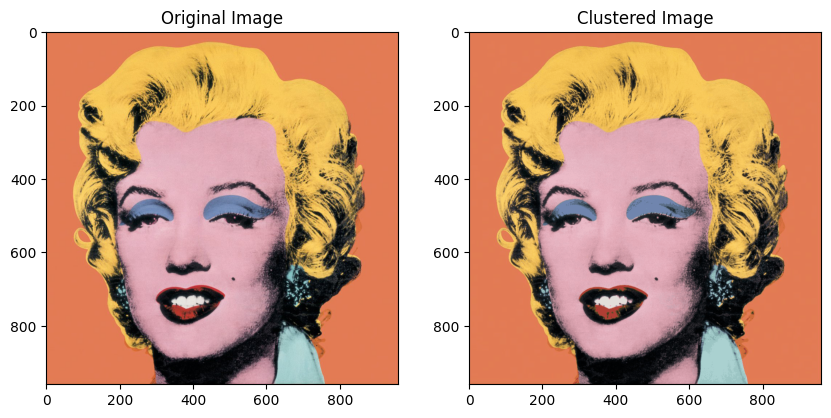

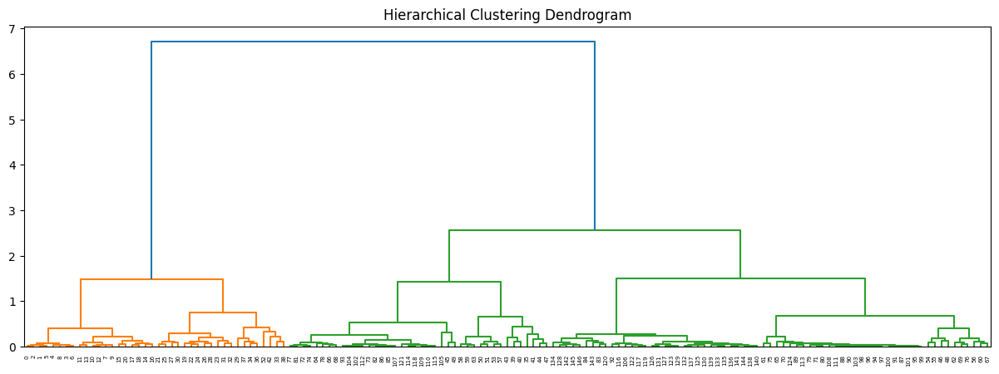

Cluster labels: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 2 2 2 2 2 3 2 2 2 3 3 5 3
 3 3 5 5 5 3 5 5 4 7 5 7 4 5 5 3 5 7 7 7 5 5 5 7 7 7 5 4 7 4 7 4 7 7 7 4 4
 4 7 7 4 4 7 7 4 4 6 6 4 4 7 7 7 7 7 6 4 7 7 7 7 7 7 7 7 4 7 4 4 6 4 7 4 4
 7 4 7 4 4 6 6 4 6 6 4 6 6 7 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6]


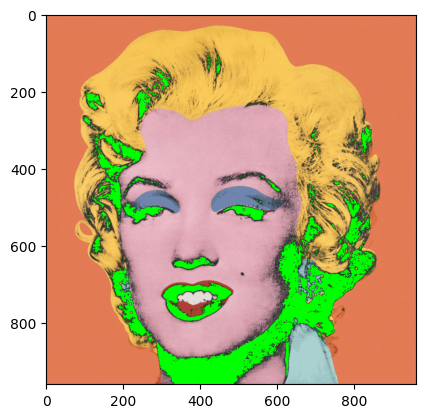

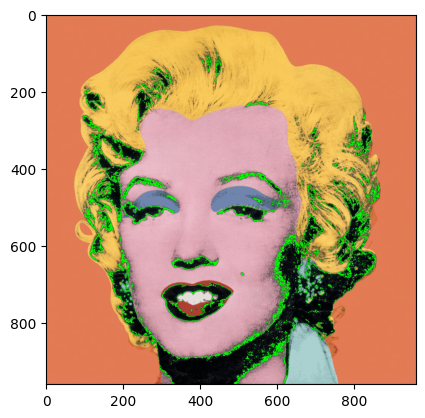

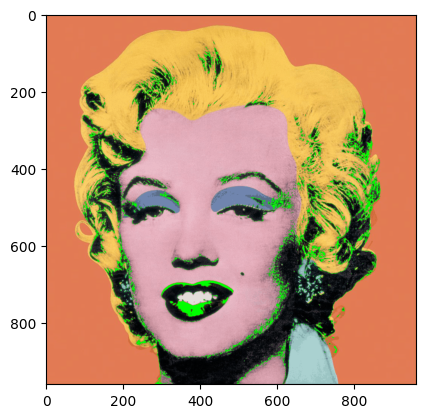

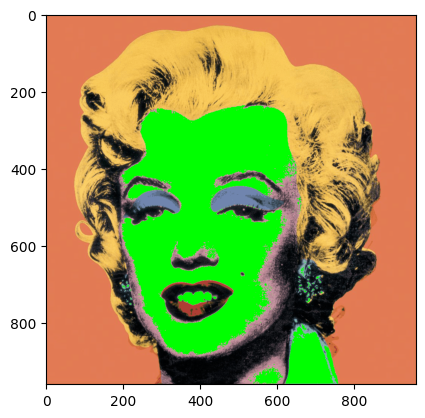

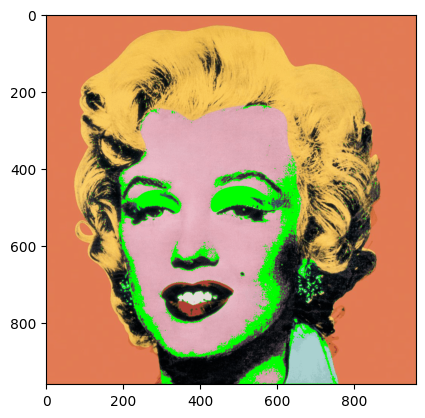

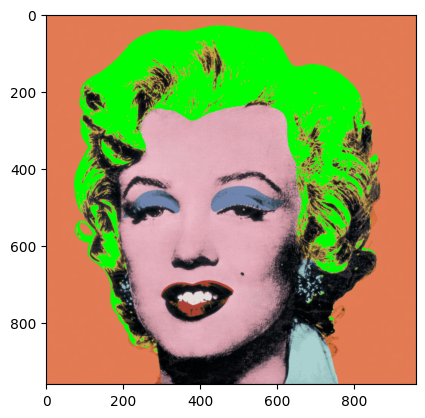

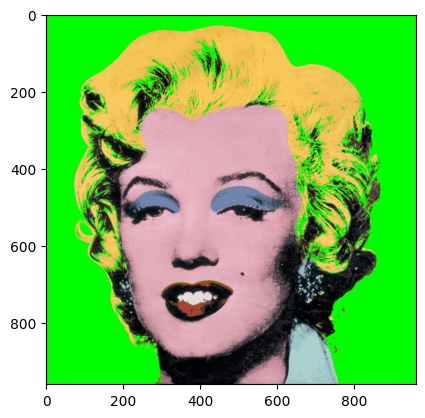

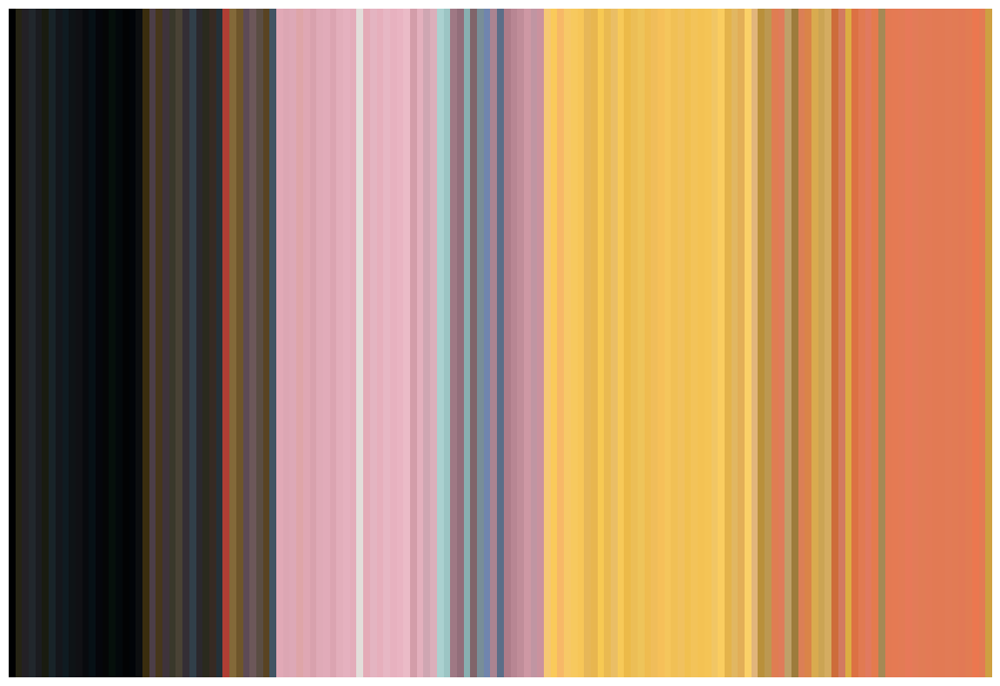

In [ ]:
HRCprocessing(images[0], 150, 0.7)

In [ ]:
HRCprocessing(images[1], 150, 0.7)

In [ ]:
HRCprocessing(images[2], 150, 0.7)

In [ ]:
HRCprocessing(images[3], 150, 0.7)

In [ ]:
HRCprocessing(images[4], 150, 0.7)

K-means

In [ ]:
Im_data = Image.open('mm_orange.png')
img =np.array(Im_data)

In [ ]:
random.seed(160)
Z = img.reshape((-1,4))
# Convert to np.float32
Z = np.float32(Z)

# Define criteria, number of clusters(K), and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS, 10, 1.0)
K = 15
ret, label, center = cv2.kmeans(Z, K, None, criteria, 20, cv2.KMEANS_PP_CENTERS)

# Convert back into uint8 and reshape to the original image shape
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img.shape))

# Display each cluster individually
figure_size = 2
num_rows = (K + 3) // 3
plt.figure(figsize=(figure_size * 3, figure_size * num_rows))

# Plot the original image
plt.subplot(num_rows, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

for i in range(K):
    # Create a mask for the current cluster
    mask = np.where(label.flatten() == i, 255, 0).reshape(img.shape[:2]).astype(np.uint8)
    # Apply the mask to the original image
    segmented_img = cv2.bitwise_and(img, img, mask=mask)
    
    # Convert segmented image from HSV to RGB
    #segmented_img_rgb = cv2.cvtColor(segmented_img[:,:,:3], cv2.COLOR_HSV2RGB)
    # Plot the segmented image
    plt.subplot(num_rows, 3, i + 2)
    plt.imshow(segmented_img)
    plt.title('Cluster {}'.format(i))
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
merged_labels = label.copy()
merged_labels = merged_labels.astype(np.uint8)
for i in range(len(merged_labels)):
    if merged_labels[i][0] in [6,12]:
        merged_labels[i][0] = 0
    if merged_labels[i][0] in [8,13,14]:
        merged_labels[i][0] = 3
    if merged_labels[i][0] in [1,7,9,10,11] :
        merged_labels[i][0] = 4
    if merged_labels[i][0] ==5:
        merged_labels[i][0] = 1

In [ ]:
# Display each cluster individually
figure_size = 2
num_rows = (K + 3) // 3
plt.figure(figsize=(figure_size * 3, figure_size * num_rows))

# Plot the original image
plt.subplot(num_rows, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')


for i in [0,1,2,3,4]:
    # Create a mask for the current cluster
    mask = np.where(merged_labels.flatten() == i, 255, 0).reshape(img.shape[:2]).astype(np.uint8)
    # Apply the mask to the original image
    segmented_img = cv2.bitwise_and(img, img, mask=mask)
    
    # Convert segmented image from HSV to RGB
    #segmented_img_rgb = cv2.cvtColor(segmented_img[:,:,:3], cv2.COLOR_HSV2RGB)
    # Plot the segmented image
    plt.subplot(num_rows, 3, i + 2)
    plt.imshow(segmented_img)
    plt.title('Cluster {}'.format(i))
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
white_image = np.ones_like(img) * 255
y_start, y_end = 439, 529
x_start, x_end = 198, 626
white_image[y_start:y_end, x_start:x_end, :] = img[y_start:y_end, x_start:x_end, :]
plt.imshow(white_image)
Y= white_image.reshape((-1,4))
Y = np.float32(Y)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 10
ret, label_eye, center_eye = cv2.kmeans(Y, K, None, criteria, 10, cv2.KMEANS_PP_CENTERS)
print(label_eye.shape)

# Convert back into uint8 and reshape to the original image shape
center_eye = np.uint8(center_eye)
res_eye = center_eye[label_eye.flatten()]
res2_eye = res_eye.reshape((white_image.shape))

In [ ]:
# Display each cluster individually
figure_size = 2
num_rows = (K + 3) // 3
plt.figure(figsize=(figure_size * 3, figure_size * num_rows))

# Plot the original image
plt.subplot(num_rows, 3, 1)
plt.imshow(white_image)
plt.title('Original Image')
plt.axis('off')

for i in range(K):
    # Create a mask for the current cluster
    mask = np.where(label_eye.flatten() == i, 255, 0).reshape(white_image.shape[:2]).astype(np.uint8)
    # Apply the mask to the original image
    segmented_img = cv2.bitwise_and(white_image, white_image, mask=mask)
    
    # Plot the segmented image
    plt.subplot(num_rows, 3, i + 2)
    plt.imshow(segmented_img)
    plt.title('Cluster {}'.format(i))
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
lip_area = np.ones_like(img)*255
y_start, y_end = 688, 800
x_start, x_end = 294, 488
lip_area[y_start:y_end, x_start:x_end, :] = img[y_start:y_end, x_start:x_end, :]
Y= lip_area.reshape((-1,4))
Y = np.float32(Y)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 10
ret, label_eye, center_eye = cv2.kmeans(Y, K, None, criteria, 10, cv2.KMEANS_PP_CENTERS)


# Convert back into uint8 and reshape to the original image shape
center_eye = np.uint8(center_eye)
res_eye = center_eye[label_eye.flatten()]
res2_eye = res_eye.reshape((lip_area.shape))

In [ ]:
# Display each cluster individually
figure_size = 2
num_rows = (K + 3) // 3
plt.figure(figsize=(figure_size * 3, figure_size * num_rows))

# Plot the original image
plt.subplot(num_rows, 3, 1)
plt.imshow(lip_area)
plt.title('Original Image')
plt.axis('off')

for i in range(K):
    # Create a mask for the current cluster
    mask = np.where(label_eye.flatten() == i, 255, 0).reshape(lip_area.shape[:2]).astype(np.uint8)
    # Apply the mask to the original image
    segmented_img = cv2.bitwise_and(lip_area, lip_area, mask=mask)
    
    # Plot the segmented image
    plt.subplot(num_rows, 3, i + 2)
    plt.imshow(segmented_img)
    plt.title('Cluster {}'.format(i))
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
for i in range(len(merged_labels)):
    if merged_labels_eye[i][0] == 6:
        merged_labels[i][0] = 5
    if merged_labels_lips[i][0] ==7:
        merged_labels[i][0] =6

In [ ]:
for i in range(len(merged_labels)):
    if merged_labels[i][0] == 4:
        merged_labels[i][0] = 17
    if merged_labels[i][0] ==6:
        merged_labels[i][0] =4
    if merged_labels[i][0] == 17:
        merged_labels[i][0]= 6

In [ ]:
# Display each cluster individually
figure_size = 2
num_rows = (K + 3) // 3
plt.figure(figsize=(figure_size * 3, figure_size * num_rows))

# Plot the original image
plt.subplot(num_rows, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

label_list = ['Skin(0)', 'Cloth(1)', 'Background(2)', 'Hair(3)','Lips(4)','Eyecolor(5)', 'Shading(6)']
for i in [0,1,2,3,4,5,6]:
    # Create a mask for the current cluster
    mask = np.where(merged_labels.flatten() == i, 255, 0).reshape(img.shape[:2]).astype(np.uint8)
    # Apply the mask to the original image
    segmented_img = cv2.bitwise_and(img, img, mask=mask)
    
    # Convert segmented image from HSV to RGB
    #segmented_img_rgb = cv2.cvtColor(segmented_img[:,:,:3], cv2.COLOR_HSV2RGB)
    # Plot the segmented image
    plt.subplot(num_rows, 3, i + 2)
    plt.imshow(segmented_img)
    plt.title(f'{label_list[i]}')
    plt.axis('off')

plt.tight_layout()
plt.show()